## CMPE-257, Machine Learning, Summer 2025
## Week 1: Introduction to Machine Learning
In this workbook, you will be exploring the perceptron learning algorithm:
- the perceptron as a binary classifier
- convergence and the learning rate parameter
- term project ideas... 

In [27]:
# YOUR NAME: Quoc Dung Lam

In [28]:
# Loading required modules
import random as rd
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt

## PART 1: The Perceptron as a Binary Classifier

In [29]:
# The following three functions provide the basis for the exporatory work you will be
# conducting in this coding session, study them and make sure you understand what they do

# PLA_MSE: computes the mean square error over a given set of data samples
# - dtn: set of data samples (list of numpy arrays)
# - tgt: set of traget values (list)
# - model: the perceptron weights (numpy array)

def pla_mse(dtn,tgt,model):  
    tst = []
    for xt in dtn:
        tst.append(np.sign(sum(xt*model)))
    return sum([(x-y)**2 for x,y in zip(tst,tgt)])/len(tgt)

# PLA_TRAIN: implements the perceptron learning algorithm
# - dtx: set of data samples (list of lists)
# - tgt: set of traget values (list)
# - wgt: initial set of weights (list of len=3) or weights are ramdomly generated
# - seq: data sequence (list of len>0) or sequence is randomly generated
# - nsteps: the maximum number of iterations (int)
# - thld: error threshold for algorithm termination
# note: this script assumes a linear classifier in 2D space (three weights only)

def pla_train(dtx,tgt,wgt,seq,nsteps=1000,thld=0.001):
    
    # initialization step
    data = [np.array(xn) for xn in [[1]+xy for xy in dtx]]
    target = tgt.copy()    
    if len(wgt)==3: wt = [np.array(wgt)]
    else: wt = [np.array([rd.uniform(-3.0,3.0) for x in range(3)])]
    if len(seq)>0: nvals = seq.copy()
    else: nvals = [rd.randint(0,len(data)-1) for x in range(nsteps)]
    mse = [pla_mse(data,target,wt[-1])]
    
    # perceptron learning algorithm
    for k,n in enumerate(nvals):    
        if mse[-1]<thld: break
        xt = data[n]
        yt = np.sign(sum(xt*wt[-1]))
        error = yt - target[n]
        if error == 0.0: continue
        new = wt[-1] - error*xt
        wt.append(new)
        mse.append(pla_mse(data,target,wt[-1]))
        if mse[-1]<thld: break
            
    # stores the training history into a data frame
    platrn = pd.DataFrame(np.array(wt),columns=['W0','W1','W2'])
    platrn['slope'] = -platrn['W1'].values/platrn['W2'].values
    platrn['intercept'] = -platrn['W0'].values/platrn['W2'].values
    platrn['mse'] = mse
    return platrn

# PLA_PLOT: creates plots for a given training-history data frame
# - dtx: set of data samples (list of lists)
# - tgt: set of traget values (list)
# - pla_df: the training-history data frame (output from PLA_TRAIN)
# note: this script also assumes a linear classifier in 2D space (three weights only)

def pla_plots(dtx,tgt,pla_df):

    fig, ax = plt.subplots(2,2,figsize=(10,8))

    # first plot: evelution of perceptron weights through the training steps
    wcols = [x for x in pla_df.columns.values if 'W' in x] 
    for col in wcols:
        ax[0,0].plot(pla_df[col].values,'*:',label=col)
    ax[0,0].legend()
    ax[0,0].set_title('Perceptron Weights')

    # second plot: evolution of the mean square error through the training steps
    ax[0,1].plot(pla_df['mse'].values,'*:',label='mse')
    ax[0,1].legend()
    ax[0,1].set_title('Mean Square Error')

    # third and fourth plot: initial and final classification boundaries with data points
    mark = ['*b' if x==1.0 else '*r' for x in tgt]
    for k in range(2):
        for n,xy in enumerate(dtx):
            ax[1,k].plot(xy[0],xy[1],mark[n])
    titles = ['Initial Model','Final Model']
    xvals = [x[0] for x in dtx]
    xx = np.arange(min(xvals)-1.0,max(xvals)+2.0)
    for n,k in enumerate([0,pla_df.shape[0]-1]):
        m = pla_df['slope'].values[k]
        b = pla_df['intercept'].values[k]
        tag = 'y = '+'{:6.3f}'.format(m)+' x + '+'{:6.3f}'.format(b)
        ax[1,n].plot(xx,[m*s+b for s in xx],'-',label=tag)
        ax[1,n].legend()
        ttl = titles[n]+' (MSE='+'{:6.3f}'.format(pla_df['mse'].values[k])+')'
        ax[1,n].set_title(ttl)
        

,W0,W1,W2,slope,intercept,mse
0,-3.0,0.0,2.0,-0.0,1.500000,1.0
1,-5.0,-8.0,-2.0,-4.0,-2.500000,2.0
2,-3.0,-6.0,4.0,1.5,0.750000,1.0
3,-1.0,0.0,12.0,-0.0,0.083333,2.0
4,-3.0,-8.0,8.0,1.0,0.375000,0.0


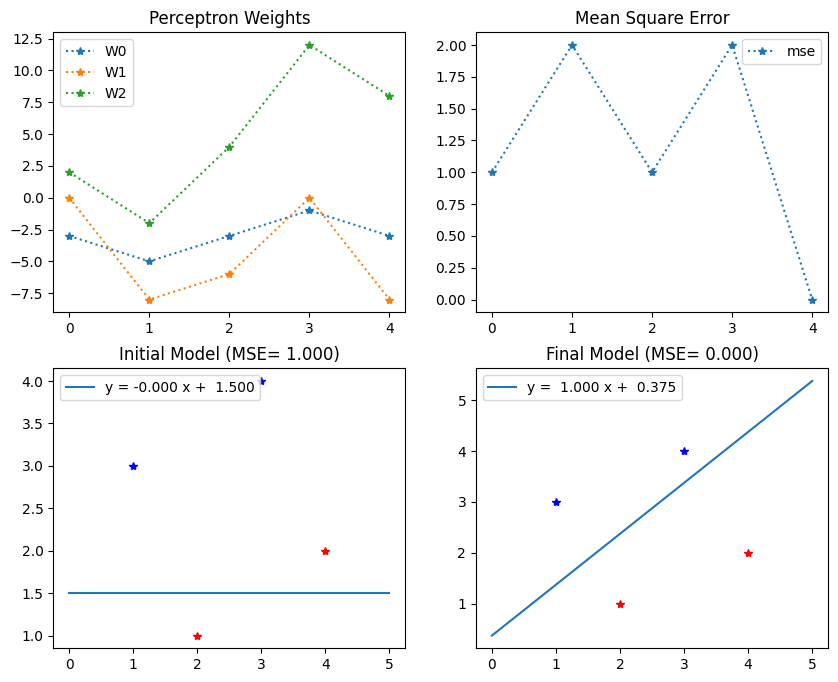

In [30]:
# Exercise #1: reproduce the example from class, display the results and generate the plots

# data samples and target values
dataset = [[1,3],[2,1],[3,4],[4,2]]
targets = [1.0,-1.0,1.0,-1.0]

# initial set of weights 
weights = [-3.0,0.0,2.0]

# sample sequence to run the algorithm
sampleseq = [0,3,0,2,2,3]

training_table = pla_train(dataset,targets,weights,sampleseq)
display(training_table)

pla_plots(dataset,targets,training_table)

In [31]:
# How results in exercises #1 compare to the example you work on in class?
# It's the same set of weights (-3, -8, 8) as a result. Doesn't matter how the sample sequence given, the result will be the same after some iteration.

,W0,W1,W2,slope,intercept,mse
0,5.0,-1.0,-1.0,-1.000000,5.0,2.00
1,7.0,5.0,7.0,-0.714286,-1.0,2.00
2,5.0,1.0,5.0,-0.200000,-1.0,2.00
3,3.0,-3.0,3.0,1.000000,-1.0,0.25
4,2.0,-5.0,2.0,2.500000,-1.0,1.00


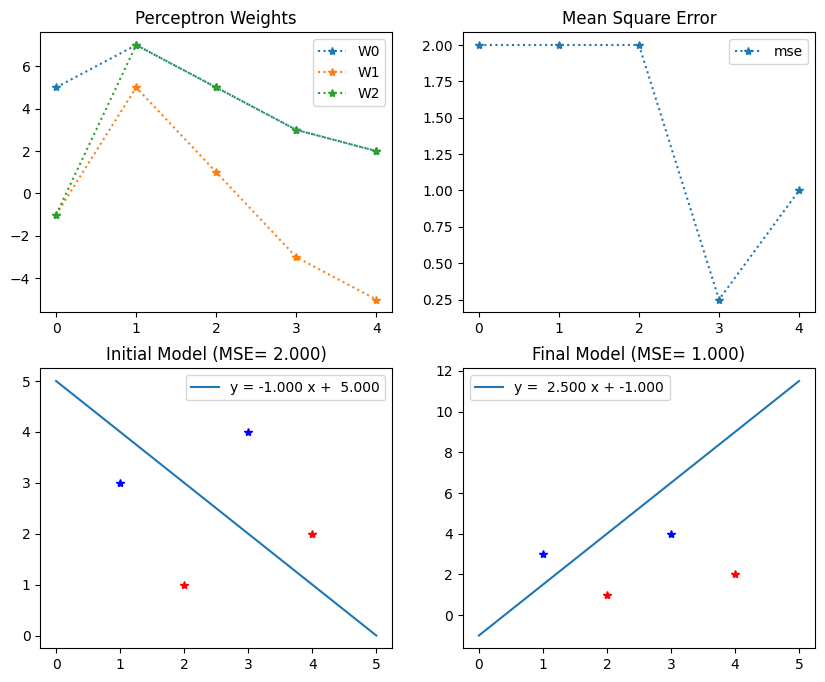

In [32]:
# Exercise #2: consider the new proposed set of weights and use a random sample sequence, 
# display the results and generate the plots 

# data samples and target values
dataset = [[1,3],[2,1],[3,4],[4,2]]
targets = [1.0,-1.0,1.0,-1.0]

# the new initial set of weights  
weights = [5.0,-1.0,-1.0]

# forces for a random sequnece of samples 
sampleseq = [3,2,1,1,2,3,1]

# add your code here...
training_table = pla_train(dataset,targets,weights,sampleseq)
display(training_table)

pla_plots(dataset,targets,training_table)

In [33]:
# What are you main observations from exercise #2?
# The result is the same set of weights (2,-5,-2) regardless of the sameplesq input.

,W0,W1,W2,slope,intercept,mse
0,-0.5,-0.7,1.0,0.7,0.5,0.0


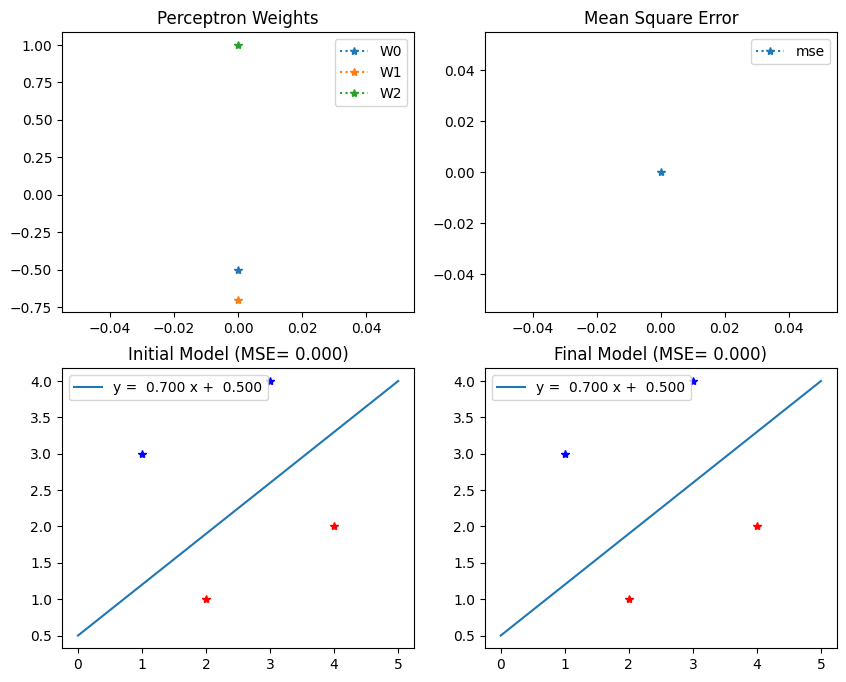

In [34]:
# Exercise #3: consider a new initial set of weights, display the results and generate the plots

# data samples and target values
dataset = [[1,3],[2,1],[3,4],[4,2]]
targets = [1.0,-1.0,1.0,-1.0]

# the new initial set of weights  
weights = [-0.5,-0.7,1.0]

# forces for a random sequnece of samples 
sampleseq = [2,1,2,1,4]

training_table = pla_train(dataset,targets,weights,sampleseq)
display(training_table)

pla_plots(dataset,targets,training_table)


In [35]:
# What is special about the inital set of weigths considered in exercise #3?
# The initial set of weights is also the answer of the problem. And since mse is zero, no extra steps needed.

,W0,W1,W2,slope,intercept,mse
0,0.5,0.7,-1.0,0.700000,0.500000,4.0
1,-1.5,-3.3,-3.0,-1.100000,-0.500000,2.0
2,0.5,2.7,5.0,-0.540000,-0.100000,2.0
3,-1.5,-5.3,1.0,5.300000,1.500000,2.0
4,0.5,0.7,9.0,-0.077778,-0.055556,2.0
5,-1.5,-3.3,7.0,0.471429,0.214286,0.0


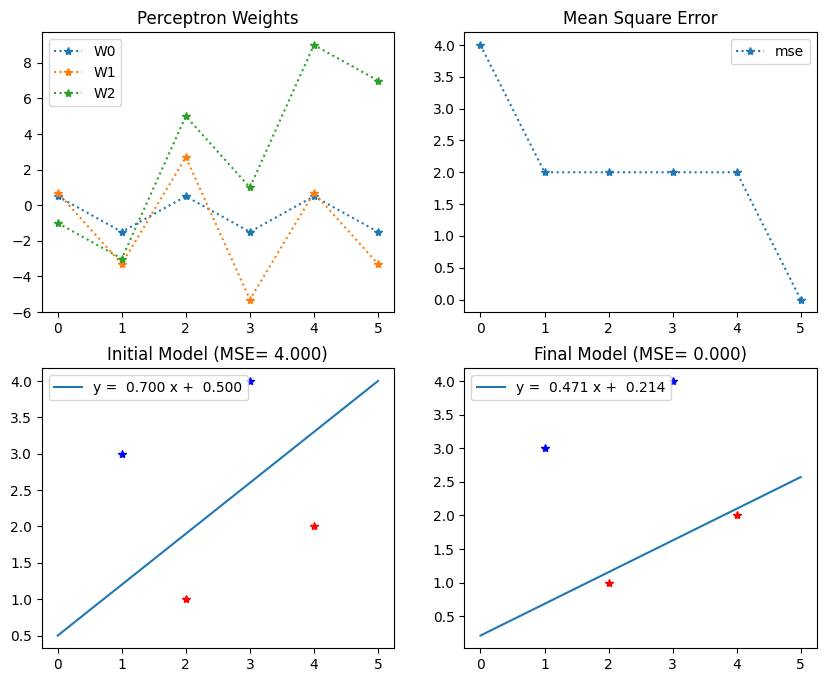

In [36]:
# Exercise #4: consider another initial set of weights, display the results and generate the plots

# data samples and target values
dataset = [[1,3],[2,1],[3,4],[4,2]]
targets = [1.0,-1.0,1.0,-1.0]

# the new initial set of weights  
weights = [0.5,0.7,-1.0]

# forces for a random sequnece of samples 
sampleseq = [1,3,2,3,2,1,1,2,2,1,2,3,1,2,3,2,1,2,3,1,2,3]

training_table = pla_train(dataset,targets,weights,sampleseq)
display(training_table)

pla_plots(dataset,targets,training_table)


In [37]:
# Compare the initial models in #3 and #4? What do you observe? Can you explain the results in #4?
# Even with the same initial model, the process and final model is different. The initial weights play as a main factor for this difference. 
# The initial weights cause the mse to be 4, that leads to the following steps calculate with a different set of parameters and therefore, causing the final model from #4 
# is not similar to #3.

## Part 2: Convergence and the Learning Rate Parameter

In [38]:
# Exercise #5: for the given initial conditions, repeat the training 20 times and print 
# the total number of iterations for each training run (i.e. training_table.shape[0])
import random
# data samples and target values
dataset = [[1,3],[2,1],[3,4],[4,2]]
targets = [1.0,-1.0,1.0,-1.0]

# initial set of weights 
weights = [-3.0,0.0,2.0]

# forces for a random sequnece of samples 
for i in range(0, 20):
    sampleseq = [random.randint(1, 3) for _ in range(10)]
    print(sampleseq)

    training_table = pla_train(dataset,targets,weights,sampleseq)
    print(f"Total Number of Iterations = {training_table.shape[0]}")

    #pla_plots(dataset,targets,training_table)



[1, 1, 1, 2, 3, 3, 2, 3, 3, 2]
Total Number of Iterations = 5
[1, 1, 3, 3, 2, 1, 3, 2, 2, 3]
Total Number of Iterations = 6
[2, 3, 2, 2, 3, 3, 2, 3, 3, 2]
Total Number of Iterations = 7
[3, 1, 1, 2, 2, 1, 3, 2, 3, 1]
Total Number of Iterations = 6
[3, 1, 2, 3, 2, 1, 1, 3, 1, 2]
Total Number of Iterations = 7
[3, 3, 3, 3, 3, 2, 3, 3, 2, 3]
Total Number of Iterations = 6
[2, 2, 2, 2, 1, 3, 2, 2, 2, 3]
Total Number of Iterations = 4
[2, 3, 1, 2, 3, 1, 1, 2, 3, 1]
Total Number of Iterations = 6
[3, 1, 2, 3, 2, 2, 1, 3, 3, 1]
Total Number of Iterations = 6
[3, 1, 2, 3, 2, 1, 3, 3, 1, 1]
Total Number of Iterations = 6
[2, 3, 1, 3, 3, 3, 3, 3, 1, 3]
Total Number of Iterations = 2
[2, 3, 2, 1, 1, 1, 1, 2, 1, 3]
Total Number of Iterations = 4
[2, 2, 3, 2, 2, 2, 1, 3, 1, 3]
Total Number of Iterations = 4
[2, 1, 2, 1, 2, 2, 3, 3, 2, 2]
Total Number of Iterations = 3
[3, 1, 1, 3, 1, 1, 2, 3, 3, 3]
Total Number of Iterations = 4
[1, 3, 3, 2, 3, 2, 3, 3, 1, 2]
Total Number of Iterations = 7
[3, 1, 2

In [39]:
# What are you main observations from exercise #5?
# The total number of iterations can be range from 2 to 7 times, depend on the random sampleseq

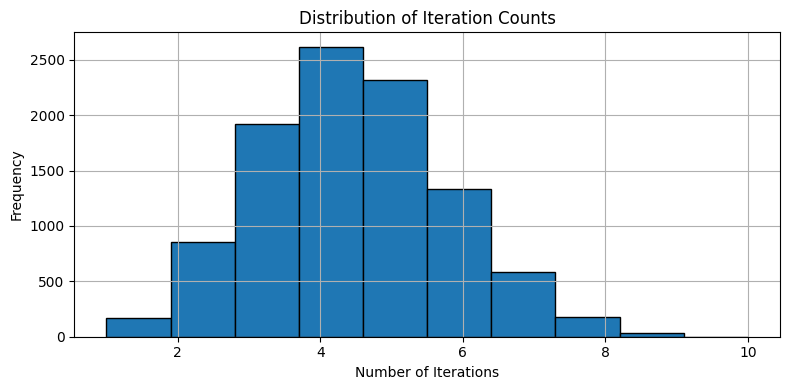

In [40]:
# Exercise #6: repeat 10K times and plot the histogram for the total number of iterations

# data samples and target values
dataset = [[1,3],[2,1],[3,4],[4,2]]
targets = [1.0,-1.0,1.0,-1.0]

# initial set of weights 
weights = [-3.0,0.0,2.0]

iteration_num = []
for i in range(0, 10000):
    sampleseq = [random.randint(1, 3) for _ in range(10)]
    #print(sampleseq)

    training_table = pla_train(dataset,targets,weights,sampleseq)
    iteration_num.append(training_table.shape[0])
    #print(f"Total Number of Iterations = {training_table.shape[0]}")

    #pla_plots(dataset,targets,training_table)
# Plot the data
plt.figure(figsize=(8, 4))
plt.hist(iteration_num, bins=10, edgecolor='black')
plt.title("Distribution of Iteration Counts")
plt.xlabel("Number of Iterations")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

In [41]:
# What are your conclusions from exercise #6?
# Most of the time, it takes 3-5 iteration to reach the final model.

C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\65062126.py:49: RuntimeWarning: invalid value encountered in divide
  platrn['slope'] = -platrn['W1'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\65062126.py:50: RuntimeWarning: divide by zero encountered in divide
  platrn['intercept'] = -platrn['W0'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\65062126.py:49: RuntimeWarning: divide by zero encountered in divide
  platrn['slope'] = -platrn['W1'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\65062126.py:50: RuntimeWarning: divide by zero encountered in divide
  platrn['intercept'] = -platrn['W0'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\65062126.py:49: RuntimeWarning: divide by zero encountered in divide
  platrn['slope'] = -platrn['W1'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\65062126.py:50: Run

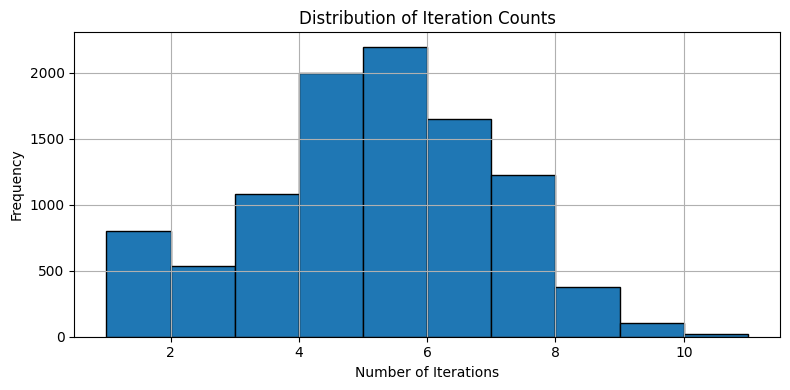

In [42]:
# Exercise #7: repeat again 10K times and plot the histogram but use random initial weights

# data samples and target values
dataset = [[1,3],[2,1],[3,4],[4,2]]
targets = [1.0,-1.0,1.0,-1.0]

# add your code here...
iteration_num = []
for i in range(0, 10000):
    # forces for a random initial set of weights  
    weights = [random.choice([i for i in range(-5, 6) if i != 0]) for _ in range(3)]
    sampleseq = [random.choice([i for i in range(1, 3) if i != 0]) for _ in range(10)]
    #print(sampleseq)

    training_table = pla_train(dataset,targets,weights,sampleseq)
    iteration_num.append(training_table.shape[0])
    #print(f"Total Number of Iterations = {training_table.shape[0]}")

    #pla_plots(dataset,targets,training_table)
# Plot the data
plt.figure(figsize=(8, 4))
plt.hist(iteration_num, bins=10, edgecolor='black')
plt.title("Distribution of Iteration Counts")
plt.xlabel("Number of Iterations")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

In [43]:
# What are you main observations? How results in exercise #7 differ from those in exercise #6?
# The initial weights and the random sequence can affect the time it takes to train the model.
# There's more instances that it takes 0 iteration to find the final model
# But most of the time it takes from 5-7 iterations compare to 3-5 compared to Exercise #6

In [53]:
# Exercise #8: use the PLA_TRAIN funtion in Part 1 to create the new funtion PlA_TRAIN_LR,
# which incorporates a new input parameter: lrate (learning rate). 

# Notice you only need to modify one line of code to incorporate the learning rate into the 
# perceptron learning algorithm, i.e. new = wt[-1] - lrate*error*xt

def pla_train_lr(dtx,tgt,wgt,seq,nsteps=1000,thld=0.001,lrate=1.0):
    
    # initialization step
    data = [np.array(xn) for xn in [[1]+xy for xy in dtx]]
    target = tgt.copy()    
    if len(wgt)==3: wt = [np.array(wgt)]
    else: wt = [np.array([rd.uniform(-3.0,3.0) for x in range(3)])]
    if len(seq)>0: nvals = seq.copy()
    else: nvals = [rd.randint(0,len(data)-1) for x in range(nsteps)]
    mse = [pla_mse(data,target,wt[-1])]
    
    # perceptron learning algorithm
    for k,n in enumerate(nvals):    
        if mse[-1]<thld: break
        xt = data[n]
        yt = np.sign(sum(xt*wt[-1]))
        #error = (yt - target[n]) * lrate
        error = (yt - target[n])
        if error == 0.0: continue
        new = wt[-1] - error*xt*lrate
        wt.append(new)
        mse.append(pla_mse(data,target,wt[-1]))
        if mse[-1]<thld: break
            
    # stores the training history into a data frame
    platrn = pd.DataFrame(np.array(wt),columns=['W0','W1','W2'])
    platrn['slope'] = -platrn['W1'].values/platrn['W2'].values
    platrn['intercept'] = -platrn['W0'].values/platrn['W2'].values
    platrn['mse'] = mse
    return platrn


C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\2020555816.py:33: RuntimeWarning: divide by zero encountered in divide
  platrn['slope'] = -platrn['W1'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\2020555816.py:34: RuntimeWarning: divide by zero encountered in divide
  platrn['intercept'] = -platrn['W0'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\2020555816.py:33: RuntimeWarning: divide by zero encountered in divide
  platrn['slope'] = -platrn['W1'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\2020555816.py:34: RuntimeWarning: divide by zero encountered in divide
  platrn['intercept'] = -platrn['W0'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\2020555816.py:33: RuntimeWarning: divide by zero encountered in divide
  platrn['slope'] = -platrn['W1'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\20205558

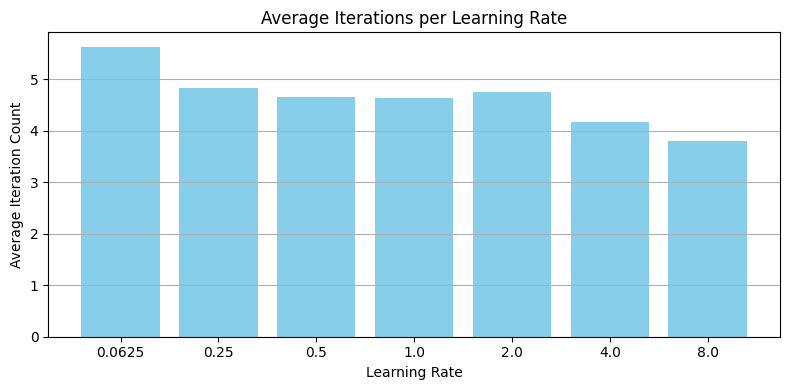

In [54]:
# Exercise #9: use your newly created function PLA_TRAIN_LR to study the effect of the
# learning rate in the perceptron learning algorithm behavior

# For each of the learning rate values provided below, run 10K times the training function
# and compute the average number of iterations needed for the algorithm to finish. Display
# the resulting values and generate a plot of average iteration steps vs learning rates.

# data samples and target values
dataset = [[1,3],[2,1],[3,4],[4,2]]
targets = [1.0,-1.0,1.0,-1.0]

# uses random initial weights and sample sequences
weights = []
sampleseq = []

# use the following values for the learning rate parameter
learning_rates = [0.0625,0.25,0.5,1.0,2.0,4.0,8.0]

plt_data = {}

for lr in learning_rates:
    iteration_num = []
    for i in range(0, 10000):
        # forces for a random initial set of weights  
        weights = [random.choice([i for i in range(-5, 6) if i != 0]) for _ in range(3)]
        sampleseq = [random.choice([i for i in range(1, 3) if i != 0]) for _ in range(10)]
        #print(sampleseq)

        training_table = pla_train_lr(dataset,targets,weights,sampleseq,lrate=lr)
        iteration_num.append(training_table.shape[0])
        #print(f"Total Number of Iterations = {training_table.shape[0]}")

        #pla_plots(dataset,targets,training_table)
    # put the lr and iter num to data
    plt_data[lr] = sum(iteration_num) / len(iteration_num)

# Step 4: Plot as bar chart (better than histogram for this data)
plt.figure(figsize=(8, 4))
plt.bar([str(lr) for lr in plt_data.keys()], plt_data.values(), color='skyblue')
plt.title("Average Iterations per Learning Rate")
plt.xlabel("Learning Rate")
plt.ylabel("Average Iteration Count")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()


In [55]:
# What are you main observations from exercise #9? 
# Adding one more parameter may affect the average iterations to get to the final model

C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\2020555816.py:33: RuntimeWarning: divide by zero encountered in divide
  platrn['slope'] = -platrn['W1'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\2020555816.py:34: RuntimeWarning: divide by zero encountered in divide
  platrn['intercept'] = -platrn['W0'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\2020555816.py:33: RuntimeWarning: divide by zero encountered in divide
  platrn['slope'] = -platrn['W1'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\2020555816.py:34: RuntimeWarning: divide by zero encountered in divide
  platrn['intercept'] = -platrn['W0'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\2020555816.py:33: RuntimeWarning: divide by zero encountered in divide
  platrn['slope'] = -platrn['W1'].values/platrn['W2'].values
C:\Users\Danny Lam\AppData\Local\Temp\ipykernel_25716\20205558

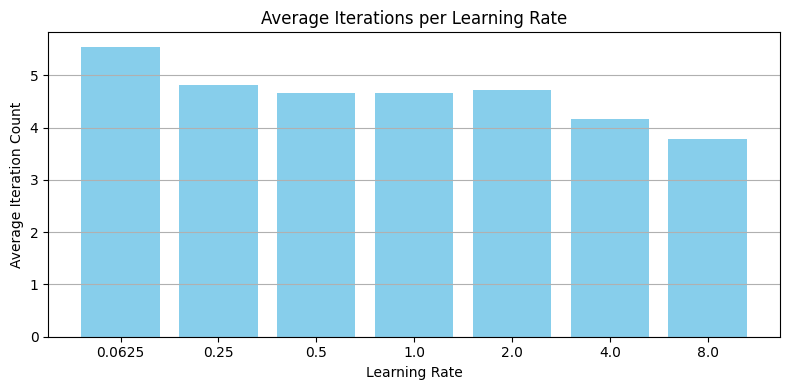

In [56]:
# Exercise #10: repeat the previous exercise but consider this time the new provided dataset,
# which includes an additional data point that makes the classification problem unsolvable
# by means of a single separation boundary line

# Notice that you need to increase the threshold value for the preceptron learning algorithm 
# to stop when only one data sample is misclassified (consider thld=0.9). 

# data samples and target values
dataset = [[1,3],[2,1],[3,4],[4,2],[2,3.5]]
targets = [1.0,-1.0,1.0,-1.0,-1.0]

# uses random initial weights and sample sequences
weights = []
sampleseq = []

# use the following values for the learning rate parameter
learning_rates = [0.0625,0.25,0.5,1.0,2.0,4.0,8.0]

plt_data = {}

for lr in learning_rates:
    iteration_num = []
    for i in range(0, 10000):
        # forces for a random initial set of weights  
        weights = [random.choice([i for i in range(-5, 6) if i != 0]) for _ in range(3)]
        sampleseq = [random.choice([i for i in range(1, 3) if i != 0]) for _ in range(10)]
        #print(sampleseq)

        training_table = pla_train_lr(dataset,targets,weights,sampleseq,lrate=lr)
        iteration_num.append(training_table.shape[0])
        #print(f"Total Number of Iterations = {training_table.shape[0]}")

        #pla_plots(dataset,targets,training_table)
    # put the lr and iter num to data
    plt_data[lr] = sum(iteration_num) / len(iteration_num)

# Step 4: Plot as bar chart (better than histogram for this data)
plt.figure(figsize=(8, 4))
plt.bar([str(lr) for lr in plt_data.keys()], plt_data.values(), color='skyblue')
plt.title("Average Iterations per Learning Rate")
plt.xlabel("Learning Rate")
plt.ylabel("Average Iteration Count")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()


In [ ]:
# What are you main observations from exercise #10? Are these consistent with your previous 
# observations from exercise #9? 
# The same number from Exercise #10, it's consistent with my observations.

## Part 3: Term Project Ideas...

In [49]:
# Write two ideas you want to consider for your Term project. For each, provide: a title, 
# a brief description, and some bullet points about why you want to consider it.

In [ ]:
# Stock Price Movement Prediction
# Predict if this is a good stock to invest or not

In [ ]:
# Game Recommendation System
# Predict whether a user will like the game or not based on game genre, rating, and reviews.